# Solving the TSP using Self-Organizing Maps

This is a modified version of [som-tsp](https://github.com/diego-vicente/som-tsp/tree/master) by Diego Vicente.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import requests
import os
from tqdm import tqdm

from som_tsp.helper import read_tsp, normalize, get_neighborhood, get_route, select_closest, route_distance, plot_network, plot_route

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

### Load TSP instance

Data is available in Appendix B of the book's GitHub repo and can be read directly using URL begins with raw. The following instances are available in this folder:

| Intsnace     | Country | # of cities | Optimal length |
| --- | --- | --- | --- |
| fi10639.tsp | Finland | 10639 | 520,527 |
| it16862.tsp | Italy | 16,862 | 557,315 |
| qa194.tsp | Qatar | 194 | 9352 |
| uy734.tsp |Uruguay | 734 | 79114 |

More TSP instances are available at <a href="https://www.math.uwaterloo.ca/tsp/world/countries.html">National Traveling Salesman Problems</a>.

In [2]:
# Define the URL where the TSP instances are located
url = 'https://raw.githubusercontent.com/Optimization-Algorithms-Book/Code-Listings/256207c4a8badc0977286c48a6e1cfd33237a51d/Appendix%20B/data/TSP/'

 # TSP instance
tsp='qa194.tsp'

# Download the file if it does not exist
response = requests.get(url+tsp)
response.raise_for_status()  # Ensure we got an OK response
problem_text = response.text
with open(tsp, 'w') as file:
    file.write(problem_text)

# Read the TSP problem
problem = read_tsp(tsp)

# Obtain the normalized set of cities (w/ coord in [0,1])
cities = problem.copy()
cities[['x', 'y']] = normalize(cities[['x', 'y']])

Problem with 194 cities read.


### Create a self-organizing map

In [3]:
# The population size is 8 times the number of cities
n = cities.shape[0] * 8

# Set the number of iterations
iterations = 12000

# Set the learning rate
learning_rate=0.8

# Set the neighborhood radius
fps = 10

# Generate an adequate network of neurons 
network = np.random.rand(n, 2)
print('Network of {} neurons created. Starting the iterations:'.format(n))

Network of 1552 neurons created. Starting the iterations:


### Learning loop

In [4]:
# Store the route lengths in a list
route_lengths = []

# Store the paths
paths_x = []
paths_y = []

for i in tqdm(range(iterations)):
    if not i % 100:
        print('\t> Iteration {}/{}'.format(i, iterations), end="\r")
    # Choose a random city
    city = cities.sample(1)[['x', 'y']].values
    winner_idx = select_closest(network, city)
    
    # Generate a filter that applies changes to the winner's gaussian
    gaussian = get_neighborhood(winner_idx, n // 10, network.shape[0])

    # Update the network's weights (closer to the city)
    network += gaussian[:, np.newaxis] * learning_rate * (city - network)

    if not i % fps:
        paths_x.append(network[:, 0].copy())
        paths_y.append(network[:, 1].copy())

    # Decay the variables
    learning_rate = learning_rate * 0.99997
    n = n * 0.9997

    # Check for plotting interval
    if not i % 1000:
        plot_network(cities, network, name='diagrams/{:05d}.png'.format(i))

    # Check if any parameter has completely decayed.
    if n < 1:
        print('Radius has completely decayed, finishing execution',
              'at {} iterations'.format(i))
        break
    if learning_rate < 0.001:
        print('Learning rate has completely decayed, finishing execution',
              'at {} iterations'.format(i))
        break
    
    # Calculate distance and store in route_lengths list
    route = get_route(cities, network)
    problem = problem.reindex(route)
    distance = route_distance(problem)
    route_lengths.append(distance)

else:
    print('Completed {} iterations.'.format(iterations))

  0%|          | 0/12000 [00:00<?, ?it/s]

  0%|          | 1/12000 [00:00<23:47,  8.40it/s]

  1%|          | 103/12000 [00:03<06:01, 32.91it/s]

  2%|▏         | 207/12000 [00:06<05:35, 35.17it/s]

  3%|▎         | 303/12000 [00:08<05:55, 32.89it/s]

  3%|▎         | 403/12000 [00:11<05:28, 35.35it/s]

  4%|▍         | 507/12000 [00:14<05:24, 35.39it/s]

  5%|▌         | 607/12000 [00:17<05:26, 34.89it/s]

  6%|▌         | 707/12000 [00:20<05:21, 35.17it/s]

  7%|▋         | 807/12000 [00:23<05:21, 34.78it/s]

  8%|▊         | 907/12000 [00:26<04:57, 37.34it/s]

  8%|▊         | 1003/12000 [00:28<05:37, 32.60it/s]

  9%|▉         | 1107/12000 [00:31<04:57, 36.64it/s]

 10%|█         | 1207/12000 [00:34<05:04, 35.40it/s]

 11%|█         | 1306/12000 [00:37<04:55, 36.20it/s]

 12%|█▏        | 1406/12000 [00:40<04:50, 36.48it/s]

 13%|█▎        | 1506/12000 [00:43<04:43, 37.01it/s]

 13%|█▎        | 1606/12000 [00:45<04:41, 36.89it/s]

 14%|█▍        | 1706/12000 [00:48<04:45, 36.10it/s]

 15%|█▌        | 1806/12000 [00:51<04:44, 35.89it/s]

 16%|█▌        | 1906/12000 [00:54<04:49, 34.92it/s]

 17%|█▋        | 2006/12000 [00:57<05:19, 31.24it/s]

 18%|█▊        | 2106/12000 [01:00<04:36, 35.77it/s]

 18%|█▊        | 2206/12000 [01:03<04:28, 36.44it/s]

 19%|█▉        | 2306/12000 [01:05<04:23, 36.76it/s]

 20%|██        | 2406/12000 [01:08<04:26, 35.94it/s]

 21%|██        | 2506/12000 [01:11<04:22, 36.16it/s]

 22%|██▏       | 2606/12000 [01:14<04:30, 34.68it/s]

 23%|██▎       | 2706/12000 [01:17<04:17, 36.15it/s]

 23%|██▎       | 2806/12000 [01:20<04:17, 35.68it/s]

 24%|██▍       | 2906/12000 [01:22<04:12, 35.96it/s]

 25%|██▌       | 3006/12000 [01:25<04:24, 34.02it/s]

 26%|██▌       | 3106/12000 [01:28<04:09, 35.71it/s]

 27%|██▋       | 3206/12000 [01:31<04:05, 35.81it/s]

 28%|██▊       | 3306/12000 [01:34<03:58, 36.39it/s]

 28%|██▊       | 3406/12000 [01:36<03:59, 35.90it/s]

 29%|██▉       | 3506/12000 [01:39<03:50, 36.83it/s]

 30%|███       | 3606/12000 [01:42<03:56, 35.46it/s]

 31%|███       | 3706/12000 [01:45<04:01, 34.36it/s]

 32%|███▏      | 3806/12000 [01:48<03:48, 35.93it/s]

 33%|███▎      | 3906/12000 [01:51<03:55, 34.37it/s]

 33%|███▎      | 4006/12000 [01:53<03:49, 34.87it/s]

 34%|███▍      | 4106/12000 [01:56<03:41, 35.69it/s]

 35%|███▌      | 4206/12000 [01:59<03:37, 35.89it/s]

 36%|███▌      | 4306/12000 [02:02<03:34, 35.91it/s]

 37%|███▋      | 4406/12000 [02:05<03:29, 36.18it/s]

 38%|███▊      | 4506/12000 [02:08<03:27, 36.10it/s]

 38%|███▊      | 4606/12000 [02:10<03:27, 35.56it/s]

 39%|███▉      | 4706/12000 [02:13<03:22, 35.95it/s]

 40%|████      | 4806/12000 [02:16<03:17, 36.42it/s]

 41%|████      | 4906/12000 [02:19<03:18, 35.66it/s]

 42%|████▏     | 5003/12000 [02:22<03:27, 33.65it/s]

 43%|████▎     | 5107/12000 [02:25<03:10, 36.13it/s]

 43%|████▎     | 5207/12000 [02:27<03:11, 35.47it/s]

 44%|████▍     | 5303/12000 [02:30<03:04, 36.23it/s]

 45%|████▌     | 5407/12000 [02:33<03:01, 36.42it/s]

 46%|████▌     | 5507/12000 [02:36<03:00, 36.04it/s]

 47%|████▋     | 5607/12000 [02:39<03:01, 35.23it/s]

 48%|████▊     | 5707/12000 [02:41<02:53, 36.26it/s]

 48%|████▊     | 5807/12000 [02:44<02:50, 36.37it/s]

 49%|████▉     | 5907/12000 [02:47<02:49, 35.85it/s]

 50%|█████     | 6003/12000 [02:50<02:59, 33.42it/s]

 51%|█████     | 6103/12000 [02:53<02:56, 33.40it/s]

 52%|█████▏    | 6207/12000 [02:56<02:39, 36.41it/s]

 53%|█████▎    | 6307/12000 [02:59<02:38, 36.03it/s]

 53%|█████▎    | 6407/12000 [03:01<02:33, 36.49it/s]

 54%|█████▍    | 6503/12000 [03:04<02:28, 36.94it/s]

 55%|█████▌    | 6607/12000 [03:07<02:28, 36.38it/s]

 56%|█████▌    | 6703/12000 [03:10<02:26, 36.24it/s]

 57%|█████▋    | 6803/12000 [03:12<02:24, 35.86it/s]

 58%|█████▊    | 6907/12000 [03:15<02:21, 35.88it/s]

 58%|█████▊    | 7003/12000 [03:18<02:30, 33.25it/s]

 59%|█████▉    | 7103/12000 [03:21<02:14, 36.30it/s]

 60%|██████    | 7203/12000 [03:24<02:13, 36.02it/s]

 61%|██████    | 7307/12000 [03:27<02:08, 36.51it/s]

 62%|██████▏   | 7407/12000 [03:30<02:10, 35.10it/s]

 63%|██████▎   | 7507/12000 [03:32<02:09, 34.80it/s]

 63%|██████▎   | 7607/12000 [03:35<02:02, 35.73it/s]

 64%|██████▍   | 7703/12000 [03:38<01:56, 36.85it/s]

 65%|██████▌   | 7803/12000 [03:41<01:55, 36.34it/s]

 66%|██████▌   | 7907/12000 [03:44<01:53, 36.16it/s]

 67%|██████▋   | 8003/12000 [03:47<01:58, 33.82it/s]

 68%|██████▊   | 8107/12000 [03:49<01:47, 36.22it/s]

 68%|██████▊   | 8207/12000 [03:52<01:46, 35.53it/s]

 69%|██████▉   | 8307/12000 [03:55<01:42, 35.94it/s]

 70%|███████   | 8407/12000 [03:58<01:39, 36.16it/s]

 71%|███████   | 8507/12000 [04:01<01:35, 36.71it/s]

 72%|███████▏  | 8607/12000 [04:03<01:34, 36.08it/s]

 73%|███████▎  | 8707/12000 [04:06<01:30, 36.27it/s]

 73%|███████▎  | 8807/12000 [04:09<01:26, 36.89it/s]

 74%|███████▍  | 8907/12000 [04:12<01:24, 36.67it/s]

 75%|███████▌  | 9003/12000 [04:15<01:28, 33.70it/s]

 76%|███████▌  | 9107/12000 [04:18<01:19, 36.17it/s]

 77%|███████▋  | 9207/12000 [04:20<01:17, 36.12it/s]

 78%|███████▊  | 9307/12000 [04:23<01:11, 37.56it/s]

 78%|███████▊  | 9403/12000 [04:26<01:11, 36.20it/s]

 79%|███████▉  | 9507/12000 [04:29<01:09, 35.71it/s]

 80%|████████  | 9607/12000 [04:32<01:05, 36.27it/s]

 81%|████████  | 9707/12000 [04:34<01:02, 36.41it/s]

 82%|████████▏ | 9807/12000 [04:37<00:59, 36.84it/s]

 83%|████████▎ | 9907/12000 [04:40<00:57, 36.35it/s]

 83%|████████▎ | 10003/12000 [04:43<00:59, 33.52it/s]

 84%|████████▍ | 10103/12000 [04:45<00:51, 36.63it/s]

 85%|████████▌ | 10207/12000 [04:48<00:49, 35.94it/s]

 86%|████████▌ | 10307/12000 [04:51<00:45, 36.92it/s]

 87%|████████▋ | 10407/12000 [04:54<00:43, 36.72it/s]

 88%|████████▊ | 10507/12000 [04:57<00:41, 36.27it/s]

 88%|████████▊ | 10607/12000 [04:59<00:38, 36.46it/s]

 89%|████████▉ | 10703/12000 [05:02<00:37, 34.42it/s]

 90%|█████████ | 10803/12000 [05:05<00:33, 36.22it/s]

 91%|█████████ | 10903/12000 [05:08<00:31, 35.16it/s]

 92%|█████████▏| 11003/12000 [05:11<00:28, 34.77it/s]

 93%|█████████▎| 11107/12000 [05:14<00:24, 35.92it/s]

 93%|█████████▎| 11203/12000 [05:16<00:22, 35.94it/s]

 94%|█████████▍| 11307/12000 [05:19<00:19, 35.39it/s]

 95%|█████████▌| 11407/12000 [05:22<00:16, 34.91it/s]

 96%|█████████▌| 11507/12000 [05:25<00:13, 35.74it/s]

 97%|█████████▋| 11603/12000 [05:28<00:10, 36.65it/s]

 98%|█████████▊| 11703/12000 [05:30<00:08, 36.10it/s]

 98%|█████████▊| 11803/12000 [05:33<00:05, 35.87it/s]

 99%|█████████▉| 11907/12000 [05:36<00:02, 35.38it/s]

100%|██████████| 12000/12000 [05:39<00:00, 35.37it/s]

Completed 12000 iterations.


### Plot the route length per iteration

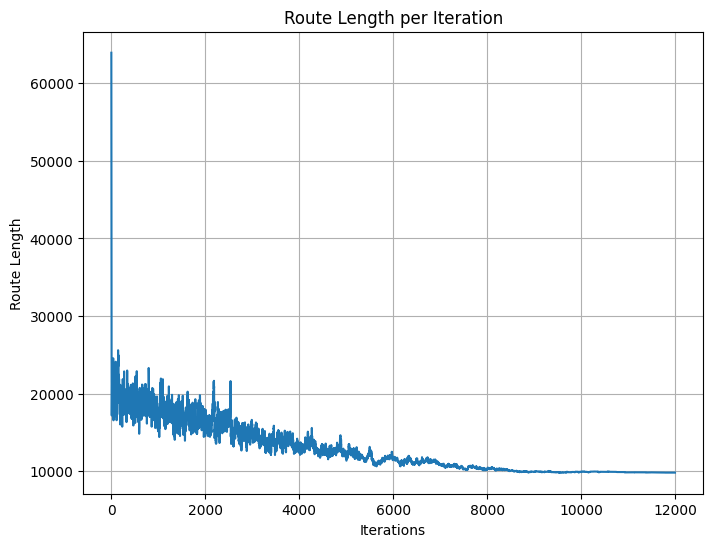

In [5]:
plt.figure(figsize=(8, 6))
plt.plot(range(len(route_lengths)), route_lengths, label='Route Length')
plt.xlabel('Iterations')
plt.ylabel('Route Length')
plt.title('Route Length per Iteration')
plt.grid(True)
# plt.show()
plt.savefig('route_lengths.png', dpi=600)

### Plot the route and its length

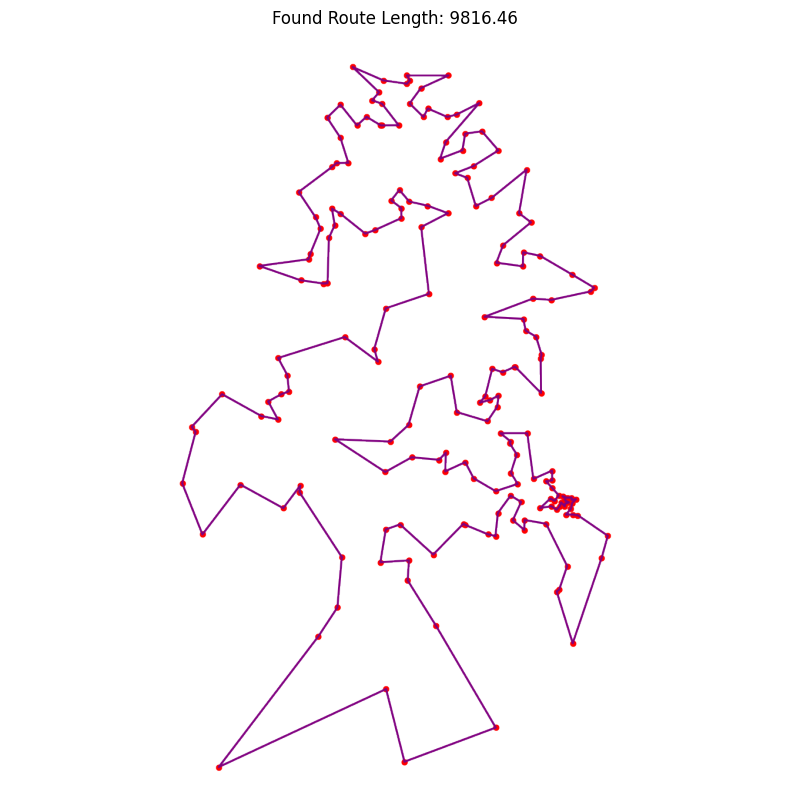

In [6]:
os.makedirs('diagrams', exist_ok=True)

plot_network(cities, network, name='diagrams/final.png')

route = get_route(cities, network)
plot_route(cities, route, 'diagrams/route.png')

problem = problem.reindex(route)
distance = route_distance(problem)

route_image_path = 'diagrams/route.png'
route_image = plt.imread(route_image_path)

plt.figure(figsize=(10, 10))
plt.imshow(route_image)
plt.axis('off')
plt.title('Found Route Length: {:.2f}'.format(distance))
plt.show()

### Create an animation for the search process

Please be informed that this code snippet takes long time to run.

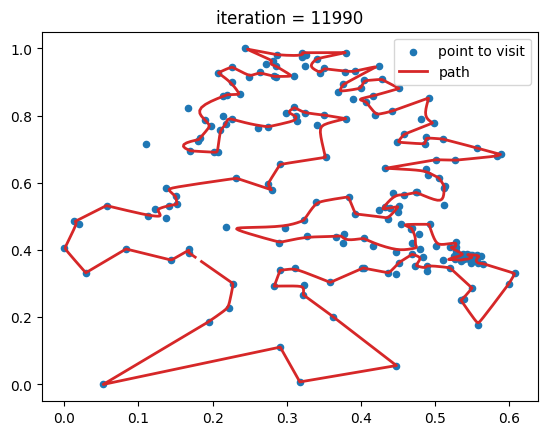

In [8]:
cities = problem.copy()
cities[['x', 'y']] = normalize(cities[['x', 'y']])
fig, ax = plt.subplots()

plt.scatter(cities['x'], cities['y'], label='point to visit', s=20)
ln, = plt.plot([], [], 'C3', linewidth=2, label='path')
plt.legend()

def update(frame):
    ln.set_data(paths_x[frame], paths_y[frame])
    plt.title('iteration = %d' % (frame*fps))
    return ln,

ani = FuncAnimation(fig, update, frames=np.arange(iterations//fps),interval=10, repeat=False, blit=True)
HTML(ani.to_html5_video())

# Solving TSP using SOM implemented in MiniSom

This is an alterantive implemetation using [MiniSom](https://github.com/JustGlowing/minisom). MiniSOM is a minimalistic and Numpy based implementation of the SOM. You can install this library using 
```shell
!pip install minisom
```

In [10]:
import tsplib95
from minisom import MiniSom

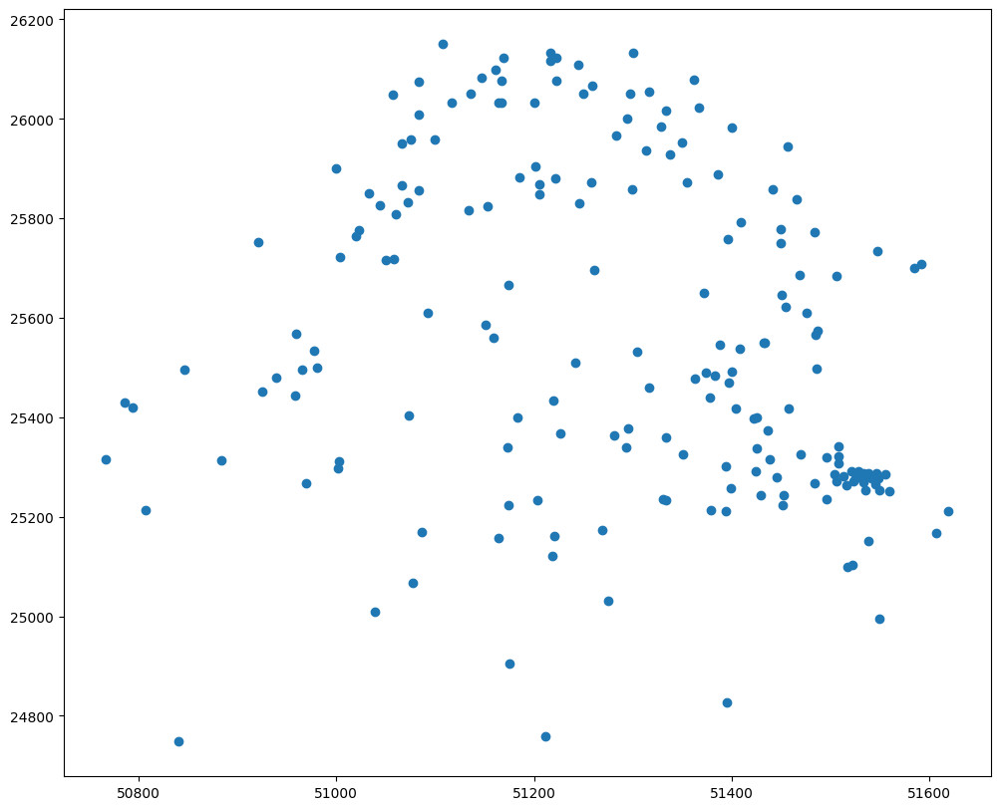

In [11]:
problem = tsplib95.parse(problem_text)

cities=problem.node_coords
city_count = len(cities)
# Get the x (longitude) and y (latitude) 2D coordinates for each city
x = [city[1][1] for city in cities.items()]
y = [city[1][0] for city in cities.items()]
points = np.array([x,y]).T
plt.figure(figsize=(12,10))
plt.scatter(x, y)

### Train SOM

In [12]:
N_neurons = city_count

# Create a self-organizing map with 1xN_neurons grid
som = MiniSom(1, N_neurons, 2, sigma=6, learning_rate=.7,
              neighborhood_function='gaussian', random_seed=0)
# Initialize weights
som.random_weights_init(points)
# Train the SOM
som.train(points, 2000, verbose=False, random_order=False)

### Run SOM to solve the TSP

In [13]:
max_iter = 10000 # Number of iterations

paths_x = [] # List to store x coordinates per iteration
paths_y = [] # List to store y coordinates per iteration
route_lengths = []  # List to store route length per iteration

for i in tqdm(np.arange(max_iter)):
    i_point = i % len(points)
    som.update(points[i_point], som.winner(points[i_point]), i, max_iter)
    visit_order = np.argsort([som.winner(p)[1] for p in points])
    visit_order = np.concatenate((visit_order, [visit_order[0]]))
    paths_x.append(points[visit_order][:, 0])
    paths_y.append(points[visit_order][:, 1])

    # Calculate route length and store in route_lengths list
    total_distance = 0
    for j in range(len(visit_order) - 1):
        total_distance += np.linalg.norm(points[visit_order[j]] - points[visit_order[j + 1]])
    route_lengths.append(total_distance)

100%|██████████| 10000/10000 [02:30<00:00, 66.66it/s]


### Plot the route length per iteration

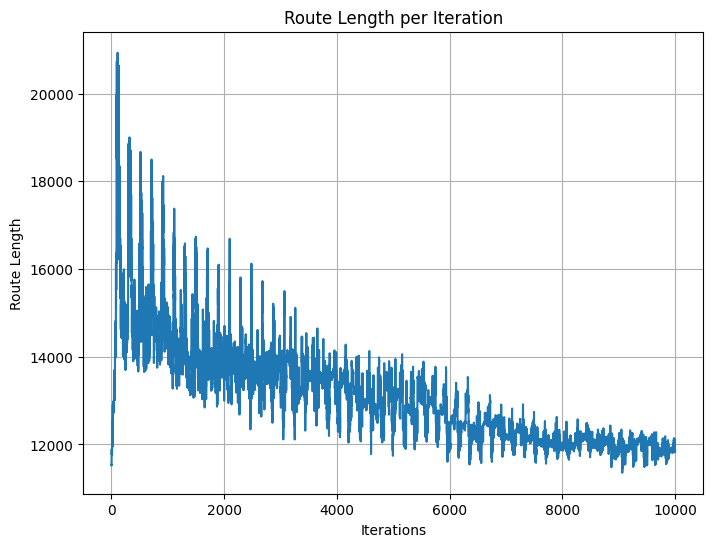

In [14]:
plt.figure(figsize=(8, 6))
plt.plot(range(max_iter), route_lengths)
plt.xlabel('Iterations')
plt.ylabel('Route Length')
plt.title('Route Length per Iteration')
plt.grid(True)
plt.show()

### Function to calculate the total distance of the path

In [15]:
def calculate_total_distance(points, visit_order):
    total_distance = 0
    for i in range(len(visit_order)-1):
        total_distance += np.linalg.norm(points[visit_order[i]] - points[visit_order[i+1]])
    return total_distance

###  Function to update the animation

In [16]:
progress_bar = tqdm(np.arange(max_iter), desc="Iteration 0", unit="iteration", total=max_iter)

def update(frame):
    progress_bar.set_description(f"Iteration {frame}/{max_iter}")

    ln.set_data(paths_x[frame], paths_y[frame])
    plt.title('iteration = %d' % frame)

    if frame == (max_iter - 1):  # check if it is the last frame
        plt.savefig('output.png', dpi=300)  # save the figure
        final_order = visit_order  # the order of visits at the last frame
        final_distance = calculate_total_distance(points, final_order)
        print(f"\nFinal TSP route length: {final_distance}")
        # Plot the final route
        final_x = points[final_order][:, 0]
        final_y = points[final_order][:, 1]
        plt.plot(final_x, final_y, 'r--', label='Final Route')
        plt.legend()

    return ln,

Iteration 0:   0%|          | 0/10000 [00:00<?, ?iteration/s]

### Visualize the search progress

Please be informed that this code snippet takes long time to run.

Iteration 9999/10000:   0%|          | 0/10000 [29:41<?, ?iteration/s]


Final TSP route length: 11844.474503868832


Iteration 0/10000:   0%|          | 0/10000 [29:42<?, ?iteration/s]   

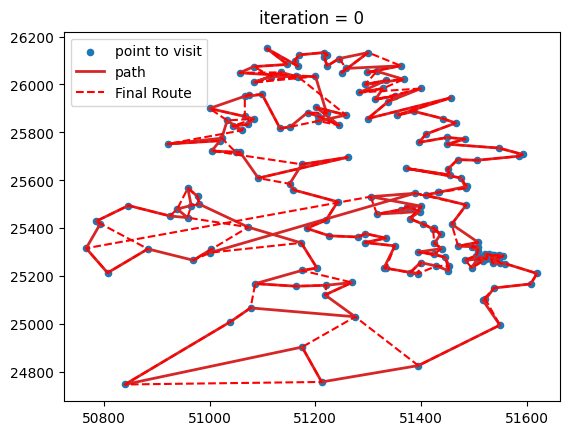

In [17]:
fig, ax = plt.subplots()
plt.scatter(x, y, label='point to visit', s=20)
ln, = plt.plot([], [], 'C3', linewidth=2, label='path')
plt.legend()

ani = FuncAnimation(fig, update, frames=np.arange(max_iter),
                    interval=10, repeat=False, blit=False)
HTML(ani.to_html5_video())